In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="0W1Ey0Jo7grnRP5C7kmh")
project = rf.workspace("fyp-advun").project("crop-disease-2rilx")
dataset = project.version(1).download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.8/195.8 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 68.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 109.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.13
    Uninstalling idna-3.13:
      Successfully uninstalled idna-3.13
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to crop-disease-1 in yolov8:: 100%|██████████| 9614/9614 [00:01<00:00, 9484.35it/s] 


In [ ]:
!ls

crop-disease-1	sample_data


In [ ]:
!ls crop-disease-1

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [ ]:
cd crop-disease-1

/content/crop-disease-1


In [ ]:
!cat data.yaml

names:
- Chili___Anthracnose_fruit
- Chili___Bacterial_leaf_spot
- Chili___Healthy_fruit
- Chili___Healthy_leaf
- Chili___Mosaic_virus_leaf
- Eggplant___Cercospora_leaf_spot
- Eggplant___Colorado_potato_beetle
- Eggplant___Fruit_rot
- Eggplant___Healthy_fruit
- Eggplant___Healthy_leaf
- Potato___Alternaria_solani_leaf
- Potato___Common_scab_fruit
- Potato___Healthy_fruit
- Potato___Healthy_leaf
- Potato___Phytopthora_infestans_leaf
- Tomato___Antrhacnose_fruit
- Tomato___Bacterial_spot_leaf
- Tomato___Early_blight_leaf
- Tomato___Healthy_fruit
- Tomato___Healthy_leaf
- Tomato___Late_blight_leaf
- Tomato___Leaf_mold
- Tomato___Tomato_yellow_leaf_curl_virus
nc: 23
roboflow:
  license: CC BY 4.0
  project: crop-disease-2rilx
  url: https://universe.roboflow.com/fyp-advun/crop-disease-2rilx/dataset/1
  version: 1
  workspace: fyp-advun
test: ../test/images
train: ../train/images
val: ../valid/images


In [ ]:
import os

# mapping function
def map_class(class_name):
    if "Healthy" in class_name:
        return 3
    elif "beetle" in class_name:
        return 2
    elif "fruit" in class_name or "rot" in class_name or "scab" in class_name:
        return 1
    else:
        return 0

# original class list
class_names = [
"Chili___Anthracnose_fruit",
"Chili___Bacterial_leaf_spot",
"Chili___Healthy_fruit",
"Chili___Healthy_leaf",
"Chili___Mosaic_virus_leaf",
"Eggplant___Cercospora_leaf_spot",
"Eggplant___Colorado_potato_beetle",
"Eggplant___Fruit_rot",
"Eggplant___Healthy_fruit",
"Eggplant___Healthy_leaf",
"Potato___Alternaria_solani_leaf",
"Potato___Common_scab_fruit",
"Potato___Healthy_fruit",
"Potato___Healthy_leaf",
"Potato___Phytopthora_infestans_leaf",
"Tomato___Antrhacnose_fruit",
"Tomato___Bacterial_spot_leaf",
"Tomato___Early_blight_leaf",
"Tomato___Healthy_fruit",
"Tomato___Healthy_leaf",
"Tomato___Late_blight_leaf",
"Tomato___Leaf_mold",
"Tomato___Tomato_yellow_leaf_curl_virus"
]

# convert labels
def convert_labels(label_path):
    with open(label_path, "r") as f:
        lines = f.readlines()

    new_lines = []
    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        class_name = class_names[class_id]
        new_class = map_class(class_name)
        new_lines.append(" ".join([str(new_class)] + parts[1:]))

    with open(label_path, "w") as f:
        f.write("\n".join(new_lines))


# apply on all labels
for split in ["train", "valid", "test"]:
    label_dir = f"{split}/labels"
    for file in os.listdir(label_dir):
        convert_labels(os.path.join(label_dir, file))

print("DONE ✅")

DONE ✅


In [ ]:
data_yaml = """
train: ../train/images
val: ../valid/images
test: ../test/images

nc: 4

names:
  0: leaf_disease
  1: fruit_disease
  2: pest
  3: healthy
"""

with open("data.yaml", "w") as f:
    f.write(data_yaml)

print("data.yaml updated ✅")

data.yaml updated ✅


In [ ]:
!head train/labels/*.txt

==> train/labels/0001_jpg.rf.0bd460faf2e06f9aa6c5fc5de0cbb85b.txt <==
3 0.575 0.64375 0.1734375 0.2796875
3 0.6140625 0.3953125 0.1734375 0.2328125
3 0.4125 0.4296875 0.178125 0.184375
3 0.434375 0.1953125 0.1984375 0.225
==> train/labels/0001_jpg.rf.2578f382764960c09f97fd95eb0b667b.txt <==
3 0.4625 0.3890625 0.3296875 0.240625
3 0.5796875 0.6 0.346875 0.3015625
3 0.7015625 0.2234375 0.209375 0.284375
3 0.7578125 0.3890625 0.196875 0.34375
3 0.90625 0.58125 0.175 0.3609375
3 0.9171875 0.3140625 0.165625 0.234375
==> train/labels/0001_jpg.rf.6bd550dea0c4d4462cdb7de65189aa40.txt <==
3 0.575 0.35625 0.1734375 0.2796875
3 0.6140625 0.6046875 0.1734375 0.2328125
3 0.4125 0.5703125 0.178125 0.184375
3 0.434375 0.8046875 0.1984375 0.225
==> train/labels/0001_jpg.rf.d8955227cc3d718da1e721198235dc81.txt <==
3 0.5375 0.3890625 0.3296875 0.240625
3 0.4203125 0.6 0.346875 0.3015625
3 0.2984375 0.2234375 0.209375 0.284375
3 0.2421875 0.3890625 0.196875 0.34375
3 0.09375 0.58125 0.175 0.3609375
3 0.

In [ ]:
!cat data.yaml


train: ../train/images
val: ../valid/images
test: ../test/images

nc: 4

names:
  0: leaf_disease
  1: fruit_disease
  2: pest
  3: healthy


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 33.8 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
model = YOLO('yolov8n.pt')

model.train(
    data='/content/crop-disease-1/data.yaml',
    epochs=70,
    imgsz=640,
    batch=16,
    patience=20,
    lr0=0.001
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.45 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/crop-disease-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=70, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d86b03e82c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [ ]:
metrics = model.val()

print("mAP50 =", metrics.box.map50 * 100)
print("mAP50-95 =", metrics.box.map * 100)
print("Precision =", metrics.box.mp * 100)
print("Recall =", metrics.box.mr * 100)

Ultralytics 8.4.45 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 716.4±284.8 MB/s, size: 15.7 KB)
val: Scanning /content/crop-disease-1/valid/labels.cache... 353 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 353/353 164.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 23/23 4.4it/s 5.2s
                   all        353        442      0.949       0.94      0.966       0.67
          leaf_disease        219        225      0.982      0.975      0.986      0.699
         fruit_disease         31         39      0.991          1      0.995      0.759
                  pest         35         35          1      0.932      0.991      0.708
               healthy         68        143      0.821      0.853      0.893      0.515
Speed: 2.6ms preprocess, 4.5ms inference, 


image 1/1 /content/test_images/d3134594-e868-4bc8-8a16-5db5b156e1ac___UF-GRC_YLCV_Lab-02096_JPG.rf.d163868d2e131beaaf4467ea2b3b32dc.jpg: 640x640 1 leaf_disease, 8.2ms
Speed: 2.9ms preprocess, 8.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


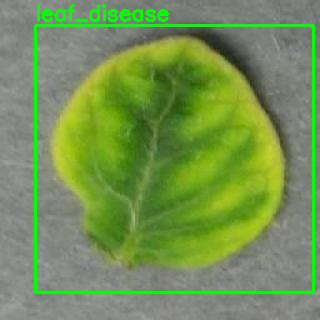


image 1/1 /content/test_images/21d6c7aa-20d7-4434-9248-e21d073e165a___RS_Erly-B-7495_JPG.rf.c1b7d2955a632bb9c6e2e0b545ba6b4f.jpg: 640x640 1 leaf_disease, 8.1ms
Speed: 4.3ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


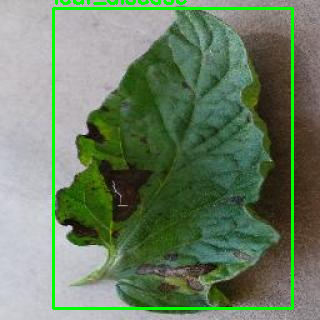


image 1/1 /content/test_images/d2d69a9b-46d7-4125-bba5-7a9cbfe71d7a___YLCV_NREC-0163_JPG.rf.9d51f5c0efe9f7775cc064a2754a77d5.jpg: 640x640 1 leaf_disease, 9.0ms
Speed: 3.3ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


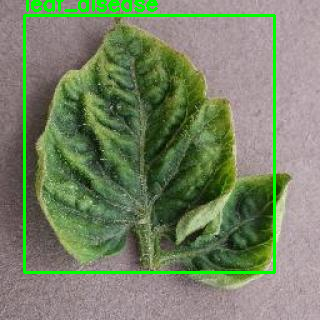


image 1/1 /content/test_images/329f2f31-ceca-402f-a007-21d64fe75f5e___Crnl_L-Mold-6519_JPG.rf.e72721da4e44f1a1da426a0e689da543.jpg: 640x640 1 leaf_disease, 7.8ms
Speed: 3.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


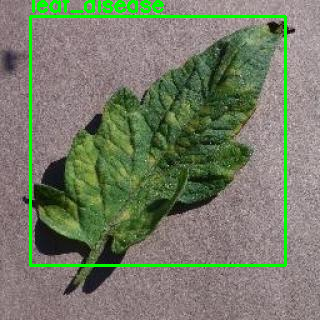


image 1/1 /content/test_images/561e6144-f53b-477e-96ef-88deff234bc6___Crnl_L-Mold-6855_JPG.rf.4c1e80701fcdabb2457638b0cc29b866.jpg: 640x640 1 leaf_disease, 9.4ms
Speed: 3.3ms preprocess, 9.4ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


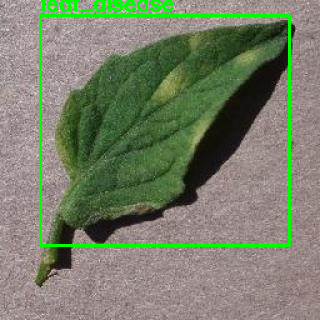


image 1/1 /content/test_images/d4135cbe-93ee-4736-b728-9fa8bfa87774___UF-GRC_YLCV_Lab-08468_JPG.rf.36af27fc546c5c85b688a2ae1d25fd0e.jpg: 640x640 1 leaf_disease, 10.1ms
Speed: 3.3ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


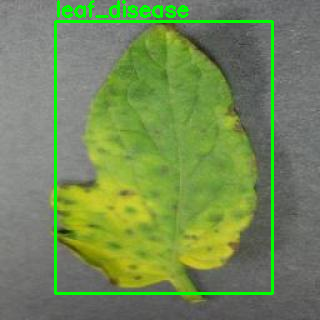


image 1/1 /content/test_images/4ff6a1de-00e2-401b-b6c2-e523289a9228___Crnl_L-Mold-6715_JPG.rf.5dfcde7665a8a5eb48fd70eb8c6da356.jpg: 640x640 1 leaf_disease, 8.2ms
Speed: 3.5ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


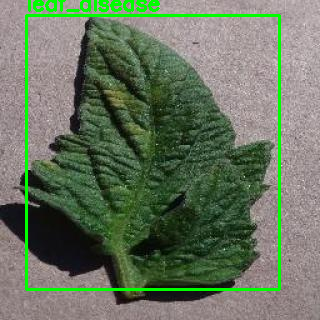


image 1/1 /content/test_images/0050_jpg.rf.93eca0a492ce0a5a96dacbd0aeff60f0.jpg: 640x640 16 healthys, 9.4ms
Speed: 3.1ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


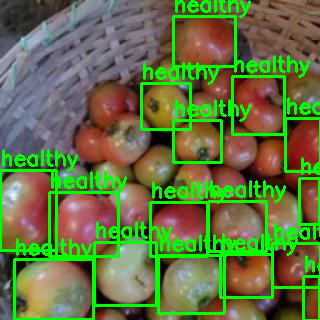


image 1/1 /content/test_images/91592d84-fcea-49ca-a09a-752c12b4d3fe___GCREC_Bact-Sp-3093_JPG.rf.5d32dd234713c39ef80eff1113883ed9.jpg: 640x640 1 leaf_disease, 10.1ms
Speed: 3.3ms preprocess, 10.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


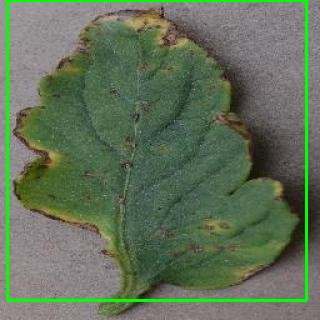


image 1/1 /content/test_images/409c349a-7738-41fc-8a3a-844cd33cfcae___RS_HL-9825_JPG.rf.34e15a3addf11439c921b63ddee8d346.jpg: 640x640 1 healthy, 9.1ms
Speed: 3.5ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


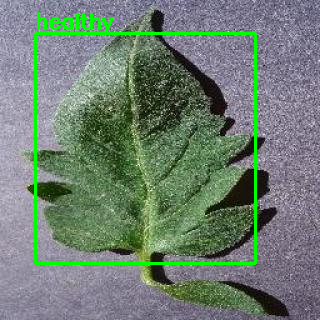


image 1/1 /content/test_images/283a4ff6-4a72-498d-b5fc-df970b8b4b83___RS_HL-9643_JPG.rf.4614c0f1247c0627c0c76d905d794087.jpg: 640x640 1 healthy, 9.5ms
Speed: 3.3ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


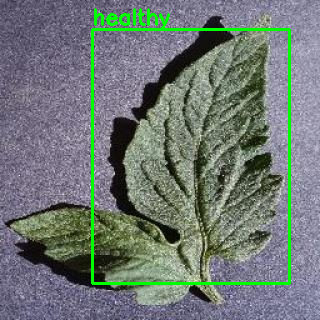


image 1/1 /content/test_images/d5cf00b6-a02b-4d2e-83f2-7663815a79c2___UF-GRC_YLCV_Lab-02343_JPG.rf.4e2f6a1674bddd214ec3591ad2b4d8ee.jpg: 640x640 1 leaf_disease, 8.8ms
Speed: 3.3ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


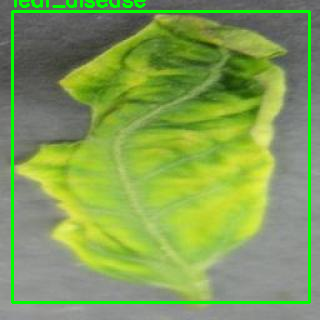


image 1/1 /content/test_images/60c13496-85a3-4c97-8242-d7c61bdd3a1f___Crnl_L-Mold-6936_JPG.rf.2fb2bc1693cf998ce1fe468ac770a577.jpg: 640x640 1 leaf_disease, 8.2ms
Speed: 3.4ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


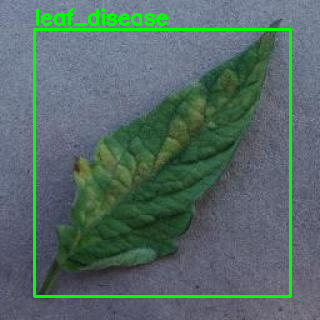


image 1/1 /content/test_images/d49f447e-dcf2-4c39-9672-a9078fce812a___YLCV_NREC-2444_JPG.rf.6978fc64b84bfc3f2c7feb889b3047c5.jpg: 640x640 1 leaf_disease, 7.5ms
Speed: 3.8ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


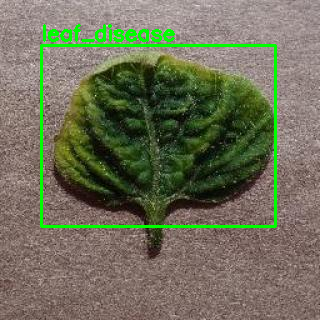


image 1/1 /content/test_images/40edit_jpg.rf.edf31c0d245ee53b3128ef92837cb597.jpg: 640x640 1 fruit_disease, 8.8ms
Speed: 3.3ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


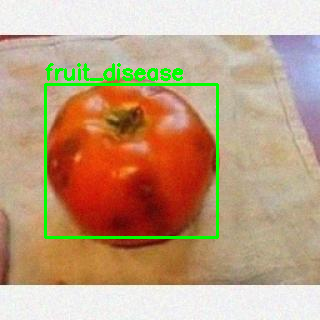


image 1/1 /content/test_images/4241f3aa-06c9-433a-91ef-97061a03dfae___RS_Late-B-4985_JPG.rf.20ea261401175c1ff3717df0da7a4b49.jpg: 640x640 1 leaf_disease, 8.6ms
Speed: 3.1ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


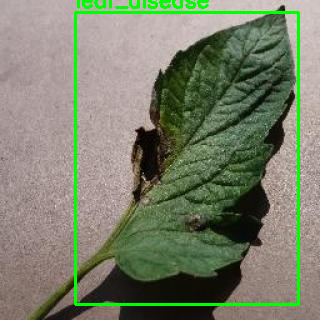


image 1/1 /content/test_images/22b8de0e-636d-4407-a270-ef3614c33227___RS_Erly-B-8257_JPG.rf.1c6237d287449b03f66dc2be28232d6b.jpg: 640x640 1 leaf_disease, 10.5ms
Speed: 3.3ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


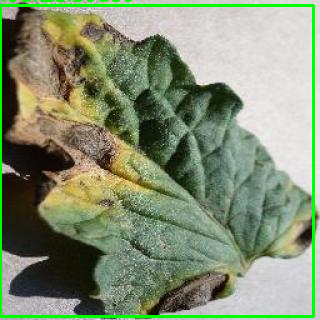


image 1/1 /content/test_images/505aa99f-6336-43e6-b9d1-4ee69c19626d___Crnl_L-Mold-6825_JPG.rf.a813df9b0afaa3329ecf4132ee9f704b.jpg: 640x640 1 leaf_disease, 11.5ms
Speed: 3.8ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


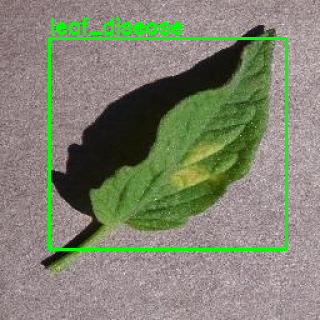


image 1/1 /content/test_images/4187b29a-6f70-4d07-b88c-73f6f60dcb26___RS_HL-0343_JPG.rf.3a23a8cc6169d6c1e0ec9da34b45fa81.jpg: 640x640 1 healthy, 9.7ms
Speed: 4.9ms preprocess, 9.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


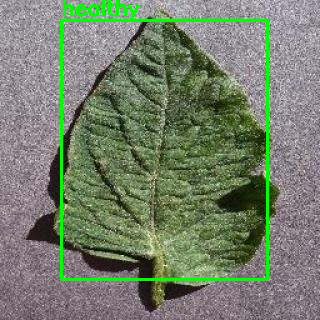


image 1/1 /content/test_images/30f2c918-bb60-4d4f-b171-7fecdfac7cac___RS_Erly-B-9543_JPG.rf.4bb52b609bb5a46ada328bad36c698f1.jpg: 640x640 1 leaf_disease, 8.6ms
Speed: 3.3ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


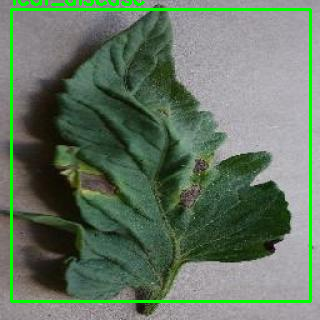


image 1/1 /content/test_images/d7b4c58c-f9c5-413e-953f-2d51e83f3b66___YLCV_GCREC-5314_JPG.rf.36b528648a1f17f20cdb3e2053a85692.jpg: 640x640 1 leaf_disease, 7.8ms
Speed: 3.1ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


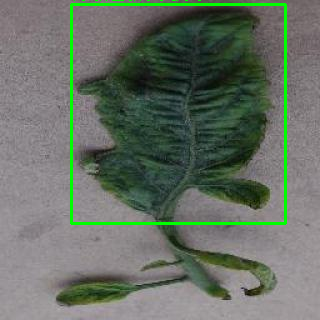


image 1/1 /content/test_images/3956f2c5-b3a4-49a4-8612-c7003d62698b___RS_Late-B-6287_JPG.rf.c8a3139b9811146d99154b4f3d77934d.jpg: 640x640 1 leaf_disease, 9.1ms
Speed: 3.1ms preprocess, 9.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


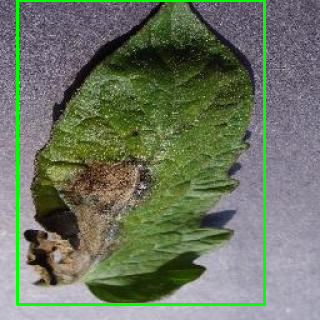


image 1/1 /content/test_images/38b_jpg.rf.828873008c4f0ae88a292b3123fdb17c.jpg: 640x640 1 fruit_disease, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


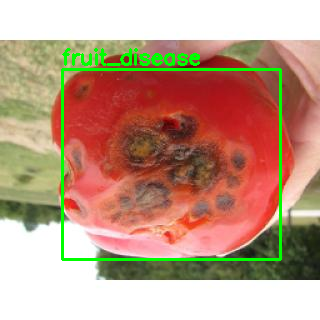


image 1/1 /content/test_images/63ed021f-afc3-44cc-ab70-0bacc9815d3e___Crnl_L-Mold-6997_JPG.rf.1e9eae33b7873b05c763346dee90b913.jpg: 640x640 1 leaf_disease, 8.0ms
Speed: 3.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


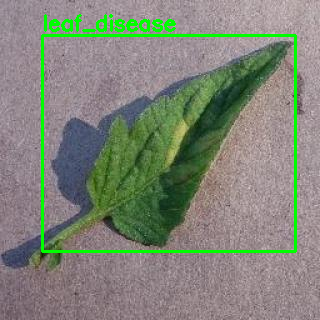


image 1/1 /content/test_images/39_jpg.rf.996969e7c9dbcdbdff3473fdb9e9369a.jpg: 640x640 1 fruit_disease, 1 healthy, 9.2ms
Speed: 3.5ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


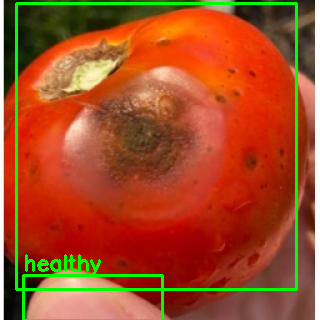


image 1/1 /content/test_images/692_Antraknos__2_-removebg-preview-4-Copyedit4_jpg.rf.f2ce4b20f9778ad270b7045c3302702c.jpg: 640x640 1 fruit_disease, 8.7ms
Speed: 3.3ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


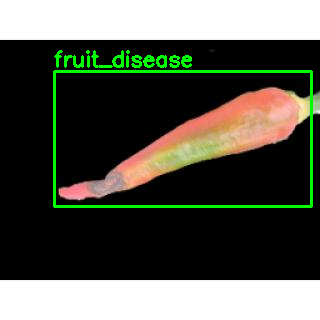


image 1/1 /content/test_images/736981e7-574c-4d75-b377-f56727bb6e49___GCREC_Bact-Sp-3240_JPG.rf.61f2fdfd186f17fc35013f577a385ead.jpg: 640x640 1 leaf_disease, 7.7ms
Speed: 3.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


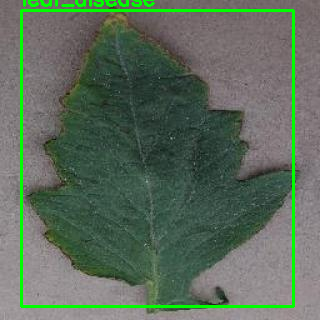


image 1/1 /content/test_images/42925d12-5478-4773-acdd-88b8361f8bb9___RS_Late-B-5458_JPG.rf.ae1ce859f7a854bc1121226d8d9df786.jpg: 640x640 1 leaf_disease, 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


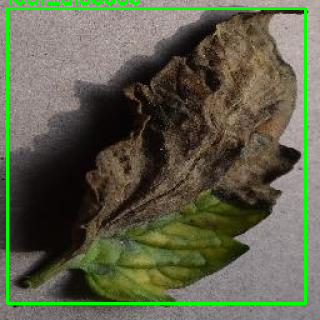


image 1/1 /content/test_images/0025_jpg.rf.9c90f2a971a79d742a5d97d823f46f59.jpg: 640x640 6 healthys, 7.6ms
Speed: 3.1ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


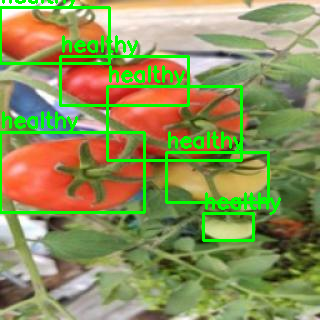


image 1/1 /content/test_images/291a778d-bfbd-450e-98a8-d8276a9a5cf2___GH_HL-Leaf-486-1_JPG.rf.31aeb5b2af0db2d8d1d11e04e1deac6a.jpg: 640x640 1 healthy, 9.1ms
Speed: 3.0ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


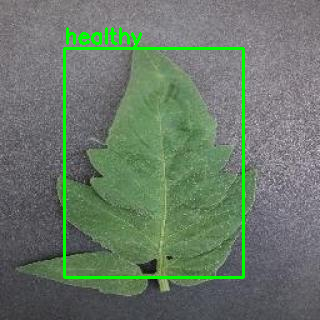


image 1/1 /content/test_images/67b422e6-78d5-4943-8926-4a2ac8bbde52___Crnl_L-Mold-8843_JPG.rf.2ae8612244258ad3e3a3fbce5143ab4b.jpg: 640x640 1 leaf_disease, 9.5ms
Speed: 4.1ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


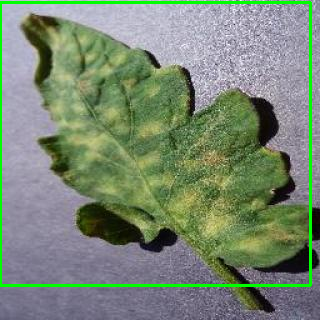


image 1/1 /content/test_images/d172c762-1d64-4974-a866-34b3570f8ccb___YLCV_NREC-0288_JPG.rf.3dca260038b8ba010761198526140d4f.jpg: 640x640 1 leaf_disease, 8.7ms
Speed: 3.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


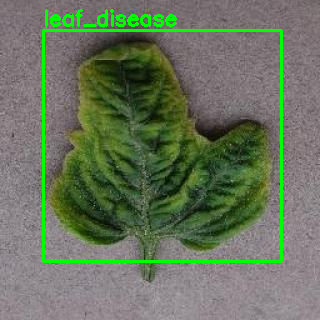


image 1/1 /content/test_images/d519df4e-739b-40ca-ac03-109eee9683fb___YLCV_GCREC-5236_JPG.rf.707dcdb1f9e2b6aa139d57ee10f7a477.jpg: 640x640 1 leaf_disease, 8.4ms
Speed: 2.9ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


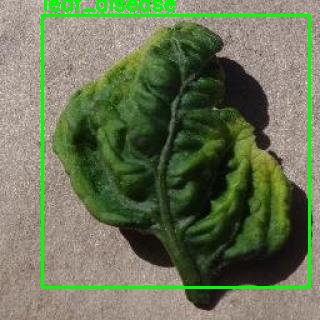


image 1/1 /content/test_images/4648b0c8-1c09-4cb9-b0dc-67515432d802___GHLB2ES-Leaf-69-3_JPG.rf.757119211c6ee544c031170b57e6781e.jpg: 640x640 1 leaf_disease, 8.8ms
Speed: 3.1ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


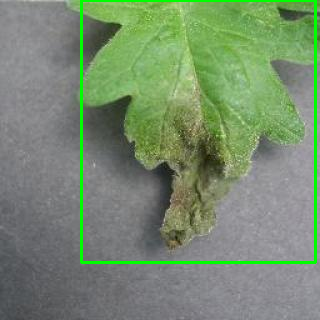


image 1/1 /content/test_images/81497af9-6503-4379-9d8e-240f43f89006___UF-GRC_BS_Lab-Leaf-0245_JPG.rf.b2780303c01bbe61218d7e70f13ccabf.jpg: 640x640 1 leaf_disease, 9.1ms
Speed: 3.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


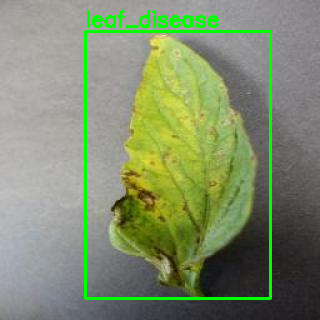


image 1/1 /content/test_images/461aa22a-be16-4dc8-9d60-45c38eabe504___RS_HL-0501_JPG.rf.89de00ee73bdfcc8153777d748686f34.jpg: 640x640 1 healthy, 9.9ms
Speed: 5.0ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


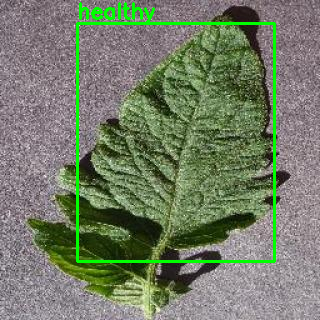


image 1/1 /content/test_images/54924dfc-c51a-426d-8f0e-d282fa7e8fd4___RS_Late-B-6481_JPG.rf.be0625a66b9fb17b3c1a9466d14abaf4.jpg: 640x640 1 leaf_disease, 7.7ms
Speed: 3.4ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


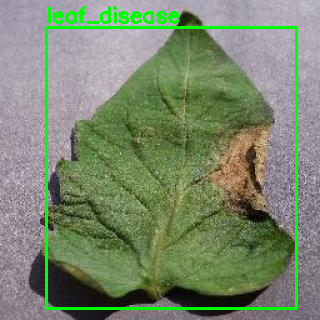


image 1/1 /content/test_images/199f4f32-6e91-4031-b861-bac1abe3452a___RS_HL-9763_JPG.rf.e53847666898c839bb2d8c673b7f7a23.jpg: 640x640 1 healthy, 8.3ms
Speed: 3.1ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


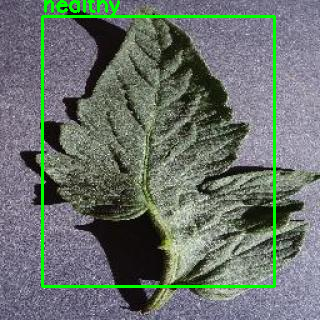


image 1/1 /content/test_images/1480b935-0081-4052-a7e8-09ef0040d9b5___GH_HL-Leaf-338_JPG.rf.ee3ecd8e3e59f5d8fc308dd84153cbd7.jpg: 640x640 1 healthy, 8.1ms
Speed: 3.4ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


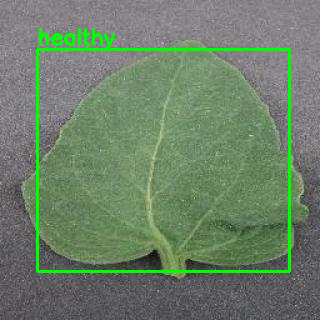


image 1/1 /content/test_images/692_Antraknos__2_-removebg-preview-2-Copyedit3_jpg.rf.976b426b9bd2fb7c27825c9a9b9fe692.jpg: 640x640 1 fruit_disease, 8.4ms
Speed: 3.1ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


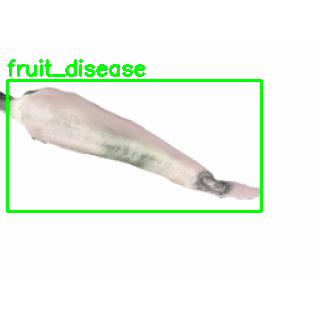


image 1/1 /content/test_images/47e03272-d314-4928-bf7c-eda3ba6e7371___RS_Erly-B-7380_JPG.rf.3264a140e201e14d5484ae5886f9ebe1.jpg: 640x640 1 leaf_disease, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


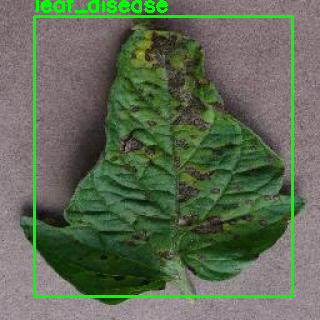


image 1/1 /content/test_images/190a6af7-d7b1-4265-b05b-c126a7962c93___GH_HL-Leaf-408_JPG.rf.c15ce0c64d765b28fd8850da182d4a15.jpg: 640x640 1 healthy, 8.5ms
Speed: 3.1ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


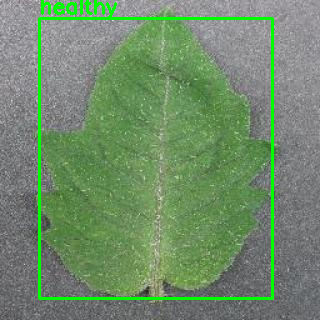


image 1/1 /content/test_images/4ce52d04-06f4-4b35-af47-804fdabed996___RS_Erly-B-8254_JPG.rf.34f36c33abafd31621010e9bf3ab8bdc.jpg: 640x640 1 leaf_disease, 11.0ms
Speed: 3.1ms preprocess, 11.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


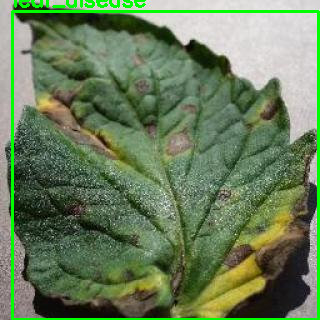


image 1/1 /content/test_images/0141_jpg.rf.5549e04bd45d36ff40d27802add2766e.jpg: 640x640 12 healthys, 13.8ms
Speed: 5.7ms preprocess, 13.8ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)


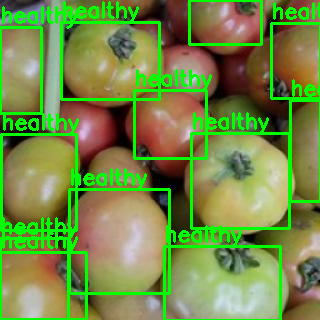


image 1/1 /content/test_images/355b3ad0-1d3b-49ea-80c8-3254a06a660c___Crnl_L-Mold-8968_JPG.rf.211f41f35daf8b45a4ec9fee54906682.jpg: 640x640 1 leaf_disease, 8.7ms
Speed: 3.4ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


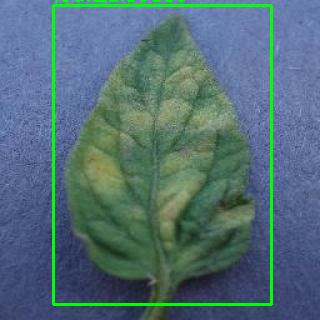


image 1/1 /content/test_images/38c6a01b-91c0-431b-8f58-05fa43cf94b7___RS_Erly-B-9408_JPG.rf.611b3859822454a3e96f5d11d95bd585.jpg: 640x640 1 leaf_disease, 8.7ms
Speed: 3.6ms preprocess, 8.7ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


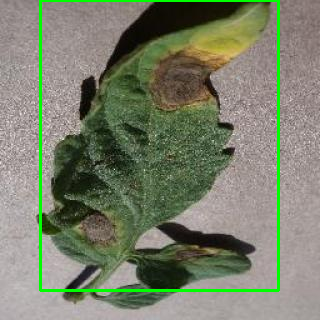


image 1/1 /content/test_images/28130e0a-20fa-47bb-a995-74933946ff2f___GHLB_PS-Leaf-24-4-Day-13_jpg.rf.cf0887d392dbc051be94e9f52e237707.jpg: 640x640 1 leaf_disease, 9.0ms
Speed: 3.4ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


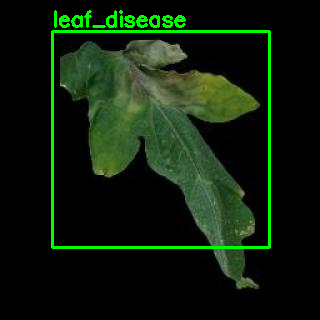


image 1/1 /content/test_images/45a51377-1fd4-45f3-bfdb-02d9d0953ab2___RS_Erly-B-9471_JPG.rf.9e16f88352ed6dd155fd145f5eab0aa2.jpg: 640x640 1 leaf_disease, 8.2ms
Speed: 3.2ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


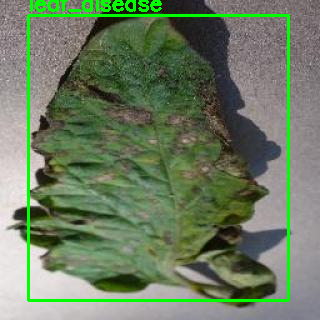


image 1/1 /content/test_images/36ceditsecond_jpg.rf.a8815c04ad5fe314cf8f19b7c96f8c19.jpg: 640x640 1 fruit_disease, 9.0ms
Speed: 3.1ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


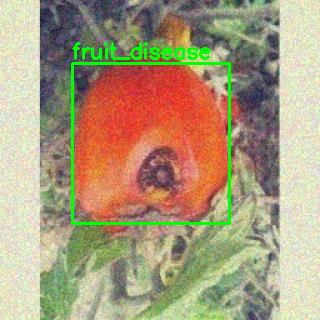


image 1/1 /content/test_images/d4c5b39a-77b5-4224-83e2-4960184acee1___UF-GRC_YLCV_Lab-02642_JPG.rf.2359822b863f392f74d5eb761a178f2c.jpg: 640x640 1 leaf_disease, 8.4ms
Speed: 2.9ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


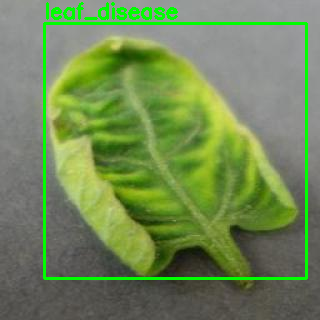

In [ ]:
import cv2
import os
from google.colab.patches import cv2_imshow

model = YOLO("/content/crop-disease-1/runs/detect/train/weights/best.pt")

folder = "/content/test_images"
images = os.listdir(folder)

for name in images[:50]:
    path = folder + "/" + name

    result = model(path)[0]

    img = cv2.imread(path)

    if result.boxes is not None:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cls = int(box.cls[0])
            label = result.names[cls]

            cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
            cv2.putText(img, label, (x1, y1-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,255,0), 2)

    cv2_imshow(img)

In [ ]:
model = YOLO("/content/crop-disease-1/runs/detect/train-2/weights/best.pt")

folder = "/content/test_images"
images = os.listdir(folder)

for name in images[:15]:
    path = folder + "/" + name

    results = model(path, conf=0.25)[0]
    boxes = results.boxes

    classes = results.names

    disease_count = 0

    if boxes is not None:
        for c in boxes.cls:
            label = classes[int(c)]
            if label != "healthy":
                disease_count += 1

    if disease_count == 0:
        print(name, "-> Healthy")
    else:
        print(name, "-> Diseased | infected areas:", disease_count)


image 1/1 /content/test_images/38c6a01b-91c0-431b-8f58-05fa43cf94b7___RS_Erly-B-9408_JPG.rf.611b3859822454a3e96f5d11d95bd585.jpg: 640x640 1 leaf_disease, 8.9ms
Speed: 2.8ms preprocess, 8.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
38c6a01b-91c0-431b-8f58-05fa43cf94b7___RS_Erly-B-9408_JPG.rf.611b3859822454a3e96f5d11d95bd585.jpg -> Diseased | infected areas: 1

image 1/1 /content/test_images/81497af9-6503-4379-9d8e-240f43f89006___UF-GRC_BS_Lab-Leaf-0245_JPG.rf.b2780303c01bbe61218d7e70f13ccabf.jpg: 640x640 1 leaf_disease, 7.2ms
Speed: 2.3ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
81497af9-6503-4379-9d8e-240f43f89006___UF-GRC_BS_Lab-Leaf-0245_JPG.rf.b2780303c01bbe61218d7e70f13ccabf.jpg -> Diseased | infected areas: 1

image 1/1 /content/test_images/409c349a-7738-41fc-8a3a-844cd33cfcae___RS_HL-9825_JPG.rf.34e15a3addf11439c921b63ddee8d346.jpg: 640x640 1 healthy, 7.2ms
Speed: 2.2ms preprocess, 7.2ms inference, 1.1ms postproc

In [ ]:
for r in model.predict(source="/content/my_all_test_images", conf=0.5):
    names = model.names
    labels = []

    for box in r.boxes:
        cls = int(box.cls[0])
        label = names[cls]
        labels.append(label)

    if len(labels) == 0:
        print("Healthy")
    else:
        if "healthy" in labels and len(labels) == 1:
            print("Healthy")
        else:
            print("Diseased ->", list(set([l for l in labels if l != "healthy"])))


image 1/250 /content/my_all_test_images/0002_jpg.rf.6d67343d3607a856fcd538235a562945.jpg: 640x640 1 healthy, 9.5ms
image 2/250 /content/my_all_test_images/0004_jpg.rf.5d499b6cc57ce01bb2e531f5c9cd2a60.jpg: 640x640 1 healthy, 7.2ms
image 3/250 /content/my_all_test_images/0012b9d2-2130-4a06-a834-b1f3af34f57e___RS_Erly-B-8389_JPG.rf.d71352d469115ca6155f3afdb034c85b.jpg: 640x640 1 leaf_disease, 7.2ms
image 4/250 /content/my_all_test_images/0013_jpg.rf.d5d758da4fbb1c8a007489c1ba9afb29.jpg: 640x640 2 healthys, 7.2ms
image 5/250 /content/my_all_test_images/0018_jpg.rf.84beb79424eaf72b2d927eaabc2eeaab.jpg: 640x640 2 healthys, 7.2ms
image 6/250 /content/my_all_test_images/0019_jpg.rf.f41de1df9afe388281c4e9e675fe05d9.jpg: 640x640 3 healthys, 7.2ms
image 7/250 /content/my_all_test_images/0023_jpg.rf.5fe7a659cf0556440e63b63b3e88a5aa.jpg: 640x640 3 healthys, 7.2ms
image 8/250 /content/my_all_test_images/0024_jpg.rf.7f19ed1d9b0acda89c07609c302fec1f.jpg: 640x640 2 healthys, 7.2ms
image 9/250 /content